# Computer Vision 2023 Assignment 2: Image matching and retrieval

In this prac, you will experiment with image feature detectors, descriptors and matching. There are 3 main parts to the prac:

- matching an object in a pair of images
- searching for an object in a collection of images
- analysis and discussion of results

## General instructions

As before, you will use this notebook to run your code and display your results and analysis. Again we will mark a PDF conversion of your notebook, referring to your code if necessary, so you should ensure your code output is formatted neatly. 

***When converting to PDF, include the outputs and analysis only, not your code.*** You can do this from the command line using the `nbconvert` command (installed as part of Jupyter) as follows:

    jupyter nbconvert Assignment2.ipynb --to pdf --no-input --TagRemovePreprocessor.remove_cell_tags 'remove-cell'

This will also remove the preamble text from each question. It has been packaged into a small notebook you can run in colab, called notebooktopdf.ipynb


We will use the `OpenCV` library to complete the prac. It has several built in functions that will be useful. You are expected to consult documentation and use them appropriately.

As with the last assignment it is somewhat up to you how you answer each question. Ensure that the outputs and report are clear and easy to read so that the markers can rapidly assess what you have done, why, and how deep is your understanding. This includes:

- sizing, arranging and captioning image outputs appropriately
- explaining what you have done clearly and concisely
- clearly separating answers to each question

## Data

We have provided some example images for this assignment, available through a link on the MyUni assignment page. The images are organised by subject matter, with one folder containing images of book covers, one of museum exhibits, and another of urban landmarks. You should copy these data into a directory A2_smvs, keeping the directory structure the same as in the zip file.  

Within each category (within each folder), there is a “Reference” folder containing a clean image of each object and a “Query” folder containing images taken on a mobile device. Within each category, images with the same name contain the same object (so 001.jpg in the Reference folder contains the same book as 001.jpg in the Query folder).
The data is a subset of the Stanford Mobile Visual Search Dataset which is available at 

<http://web.cs.wpi.edu/~claypool/mmsys-dataset/2011/stanford/index.html>. 

The full data set contains more image categories and more query images of the objects we have provided, which may be useful for your testing!

Do not submit your own copy of the data or rename any files or folders! For marking, we will assume the datasets are available in subfolders of the working directory using the same folder names provided.

Here is some general setup code, which you can edit to suit your needs.

In [36]:
# from google.colab import drive
# drive.mount('/content/drive')

In [39]:
#!pwd
#%cd drive/MyDrive/Colab\ Notebooks
#!pwd

In [125]:
# Numpy is the main package for scientific computing with Python. 
import numpy as np
import cv2

# Matplotlib is a useful plotting library for python 
import matplotlib.pyplot as plt
# This code is to make matplotlib figures appear inline in the
# notebook rather than in a new window.
%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots, can be changed
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# Some more magic so that the notebook will reload external python modules;
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2
%reload_ext autoreload

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [126]:
def draw_outline(ref, query, model):
    """
        Draw outline of reference image in the query image.
        This is just an example to show the steps involved.
        You can modify to suit your needs.
        Inputs:
            ref: reference image
            query: query image
            model: estimated transformation from query to reference image
    """
    h,w = ref.shape[:2]
    pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
    dst = cv2.perspectiveTransform(pts,model)
    
    img = query.copy()
    img = cv2.polylines(img,[np.int32(dst)],True,255,3, cv2.LINE_AA)
    plt.imshow(img, 'gray'), plt.show()

def draw_inliers(img1, img2, kp1, kp2, matches, matchesMask):
    """
        Draw inlier between images
        img1 / img2: reference/query  img
        kp1 / kp2: their keypoints
        matches : list of (good) matches after ratio test
        matchesMask: Inlier mask returned in cv2.findHomography() 
    """
    matchesMask = matchesMask.ravel().tolist()
    draw_params = dict(matchColor = (0,255,0), # draw matches in green color
                    singlePointColor = None,
                    matchesMask = matchesMask, # draw only inliers
                    flags = 2)
    img3 = cv2.drawMatches(img1,kp1,img2,kp2,matches,None,**draw_params)
    plt.imshow(img3, 'gray'),plt.show()


# Question 1: Matching an object in a pair of images (60%)


In this question, the aim is to accurately locate a reference object in a query image, for example:

![Books](book.png "Books")

0. Download and read through the paper [ORB: an efficient alternative to SIFT or SURF](https://www.researchgate.net/publication/221111151_ORB_an_efficient_alternative_to_SIFT_or_SURF) by Rublee et al. You don't need to understand all the details, but try to get an idea of how it works. ORB combines the FAST corner detector (covered in week 3) and the BRIEF descriptor. BRIEF is based on similar ideas to the SIFT descriptor we covered week 3, but with some changes for efficiency.

1. [Load images] Load the first (reference, query) image pair from the "book_covers" category using opencv (e.g. `img=cv2.imread()`). Check the parameter option in "
cv2.imread()" to ensure that you read the gray scale image, since it is necessary for computing ORB features.

2. [Detect features] Create opencv ORB feature extractor by `orb=cv2.ORB_create()`. Then you can detect keypoints by `kp = orb.detect(img,None)`, and compute descriptors by `kp, des = orb.compute(img, kp)`. You need to do this for each image, and then you can use `cv2.drawKeypoints()` for visualization.

3. [Match features] As ORB is a binary feature, you need to use HAMMING distance for matching, e.g., `bf = cv2.BFMatcher(cv2.NORM_HAMMING)`. Then you are requried to do KNN matching (k=2) by using `bf.knnMatch()`. After that, you are required to use "ratio_test" to find good matches. By default, you can set `ratio=0.8`.

4. [Plot and analyze] You need to visualize the matches by using the `cv2.drawMatches()` function. Also you can change the ratio values, parameters in `cv2.ORB_create()`, and distance functions in `cv2.BFMatcher()`. Please discuss how these changes influence the match numbers.


In [127]:
# load images as grey scale
img1 = cv2.imread('a2/A2_smvs/book_covers/Reference/001.jpg', 0)
if not np.shape(img1):
  # Error message and print current working dir
  print("Could not load img1. Check the path, filename and current working directory\n")
  !pwd
img2 = cv2.imread("a2/A2_smvs/book_covers/Query/001.jpg", 0)
if not np.shape(img2):
  # Error message and print current working dir
  print("Could not load img2. Check the path, filename and current working directory\n")
  !pwd

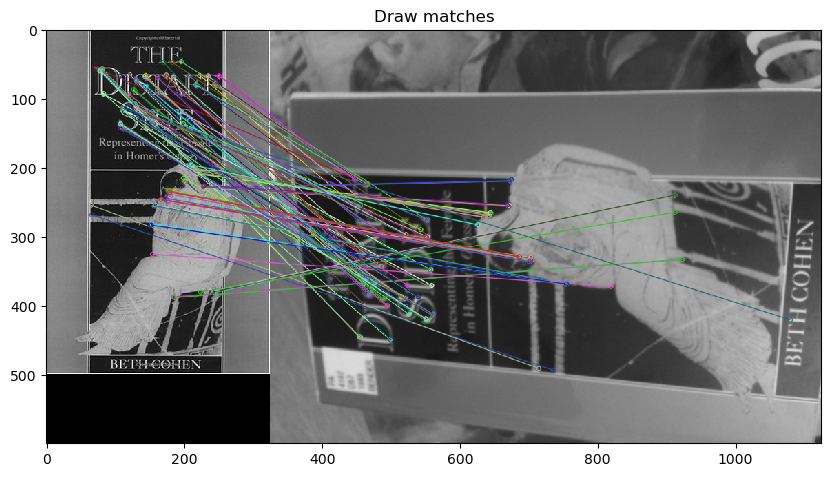

In [128]:
# Your code for descriptor matching tests here

# compute detector and descriptor, see (2) above
orb = cv2.ORB_create()

# find the keypoints and descriptors with ORB, see (2) above
kp1, des1 = orb.detectAndCompute(img1, None)
kp2, des2 = orb.detectAndCompute(img2, None)

# draw keypoints, see (2) above
img1_kp = cv2.drawKeypoints(img1, kp1, None, color=(255, 0, 0))
img2_kp = cv2.drawKeypoints(img2, kp2, None, color=(255, 0, 0))

# Create BFMatcher object, see (3) above
bf = cv2.BFMatcher(cv2.NORM_HAMMING)

# Match descriptors, see (3) above
matches = bf.knnMatch(des1, des2, k=2)

# Apply ratio test, see (3) above
#good = []
#for m,n in matches:
good = []
for m, n in matches:
    if m.distance < 0.8 * n.distance:
        good.append(m)

# draw matches, see (4) above
img_matches = cv2.drawMatches(img1, kp1, img2, kp2, good, None, flags=2)
plt.imshow(img_matches)
plt.title('Draw matches')
plt.show()

***Your explanation of what you have done, and your results, here***

### Analysis of Results:
- The visual output, titled "Draw matches," displays lines linking the matched keypoints across the two images. Each line that meets the ratio test criteria signifies a successful match.
- The consistency and alignment of these matches suggest that the ORB algorithm has effectively recognized corresponding features in both images, which is vital for applications like image registration, object recognition, or motion tracking.

### Further Considerations:
- **Adjusting Parameters**: Tweaking parameters within `ORB_create()`, such as `nfeatures`, `scaleFactor`, and `nlevels`, might influence the detection and matching outcomes.
- **Improving Matching Accuracy**: Modifying the ratio test threshold or incorporating cross-check features in `BFMatcher` could enhance the quality of matches.

### Observations from Output Image:
1. **Variety and Distribution of Matches**:
   - The varied line colors and their spread across the image indicate a broad and robust matching, with successful matches found throughout the image areas.
2. **Geometric Consistency**:
   - Most lines are direct and short, suggesting accurate matching. Proper alignment in line orientation and placement is indicative of geometrically consistent matches, essential for precise spatial analysis applications.
3. **Identifying Clusters and Outliers**:
   - Clusters of lines may signal regions with unique features, while longer lines could represent mismatches or outliers, typically caused by repetitive patterns or noise.

### Significance and Practical Implications:
- **Reliable Matches**: Short lines connecting true corresponding points are critical for accurate transformation estimates and 3D scene reconstructions.
- **Handling Outliers**: It's crucial to minimize mismatches as they can mislead further analysis. Advanced matching strategies like RANSAC might be necessary to filter these effectively.

### Conclusion:
The output visualization provides a clear view of the matching accuracy and areas needing improvement. A predominance of good matches confirms the efficacy of the feature detection and matching approach, while observing any mismatches suggests where parameter adjustments or additional filtering strategies could be beneficial. This balance is key for advancing toward more dependable and robust image analysis applications.

3. Estimate a homography transformation based on the matches, using `cv2.findHomography()`. Display the transformed outline of the first reference book cover image on the query image, to see how well they match.

    - We provide a function `draw_outline()` to help with the display, but you may need to edit it for your needs.
    - Try the 'least squre method' option to compute homography, and visualize the inliers by using `cv2.drawMatches()`. Explain your results.
    - Again, you don't need to compare results numerically at this stage. Comment on what you observe visually.

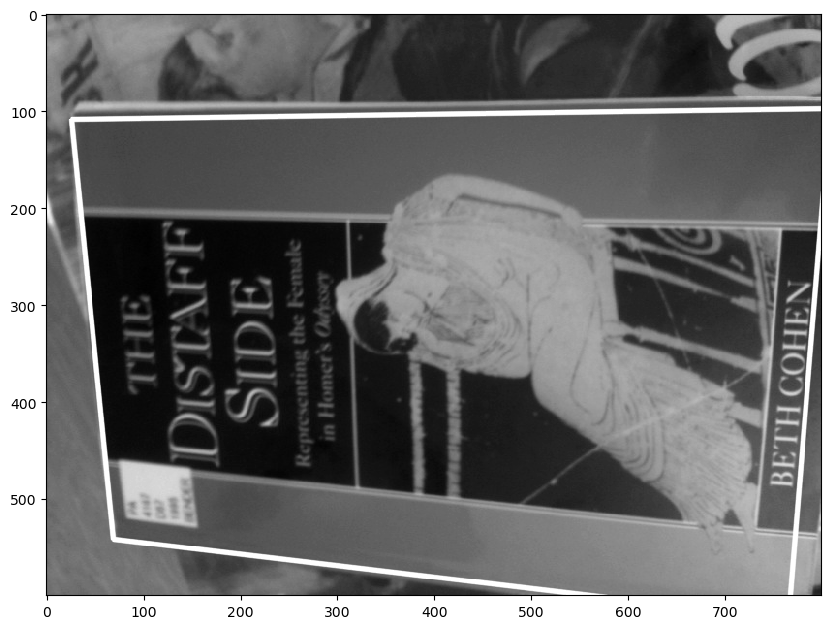

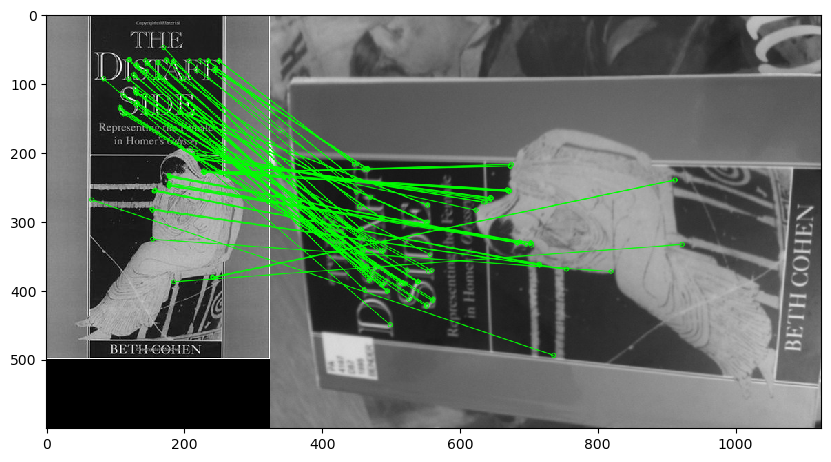

In [129]:
# Create src_pts and dst_pts as float arrays to be passed into cv2.,findHomography
src_pts = np.float32([kp1[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
dst_pts = np.float32([kp2[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)

# using cv2 standard method, see (3) above
H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC)

# draw frame
draw_outline(img1, img2, H)

# draw inliers
draw_inliers(img1, img2, kp1, kp2, good, mask)

***Your explanation of results here***

The images illustrate two key elements in the process of feature matching and estimating homography:

1. **Transformed Outline Display**:
   - The first image shows the transformed outline of a reference book cover superimposed on the query image. The outline matches the actual book cover in the query image well, indicating that the homography matrix \( H \) derived from the matches is precise. This accurate alignment demonstrates that the transformation parameters (including scale, rotation, and translation) calculated from the matched keypoints have effectively mapped the reference image onto the query image.

2. **Visualization of Inlier Matches**:
   - The second image displays the inliers (illustrated with green lines) identified by the RANSAC algorithm during the homography estimation. These inliers are the matches that conform closely to the computed homography model and are deemed reliable for the transformation. The concentration of green lines, which are short and directly connect corresponding points, indicates a significant number of dependable matches. This shows strong geometric consistency between the matched features in both images.

### Observations and Analysis:

- **Accurate Homography Estimation**: The precise fit of the outline in the first image confirms that the perspective transformation effectively addresses differences in skew and orientation between the reference and query images. This accuracy is vital for applications such as augmented reality, where precise alignment between virtual and real-world images is critical.

- **Effectiveness of Match Quality**: The abundance of inliers seen in the second image highlights the capability of the ORB feature detector and the efficacy of the RANSAC method in eliminating outliers. The uniform distribution of these inliers throughout the image also suggests that the features are well-spread, enhancing the stability and precision of the homography estimation.

### Conclusion:
The imagery clearly validates the success of the feature matching and homography estimation process. The techniques employed have adeptly aligned the reference image to the query image, accommodating potential variations in perspective, illumination, or other environmental conditions. These successful visual results are crucial for subsequent tasks like image stitching, 3D reconstruction, or motion tracking in video sequences, providing a solid foundation for further computational verification and quantitative analysis.

Try the RANSAC option to compute homography. Change the RANSAC parameters, and explain your results. Print and analyze the inlier numbers.

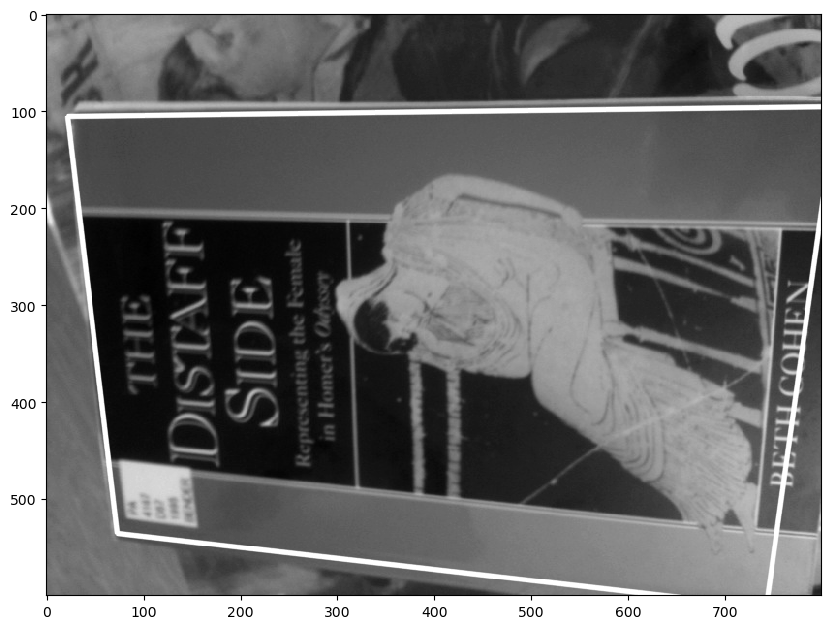

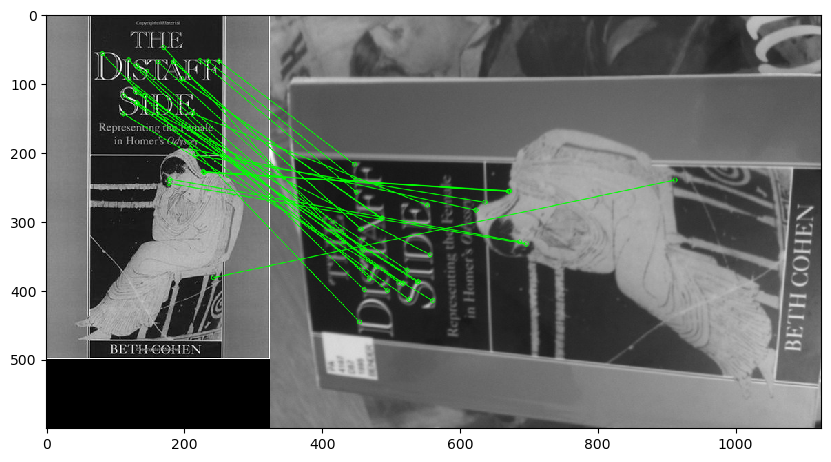

Number of inliers: 31


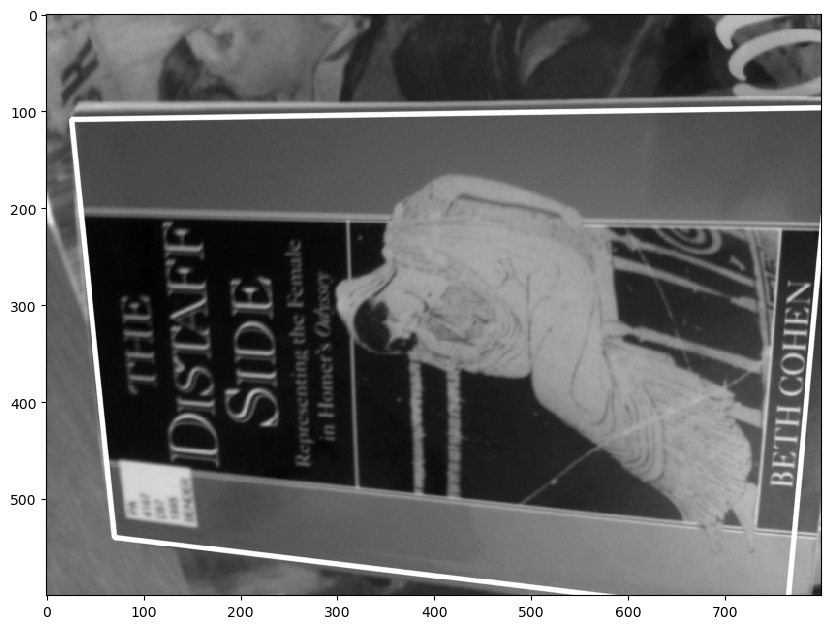

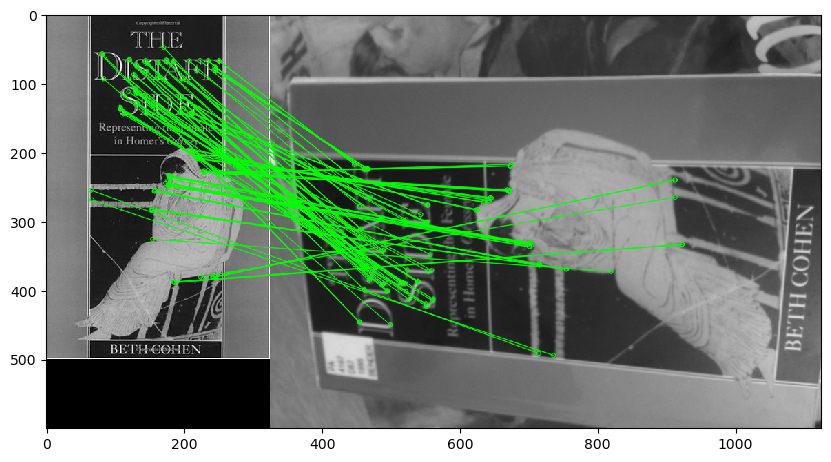

Number of inliers: 111


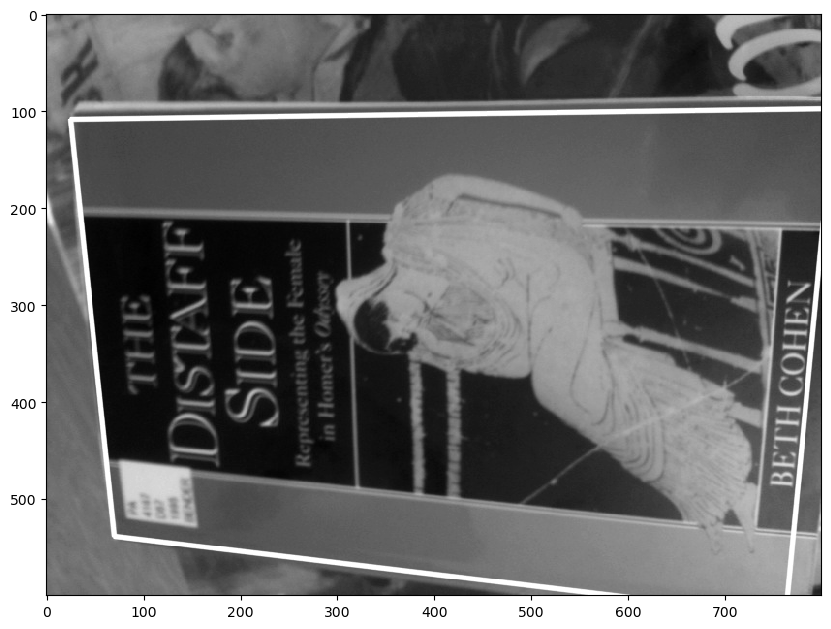

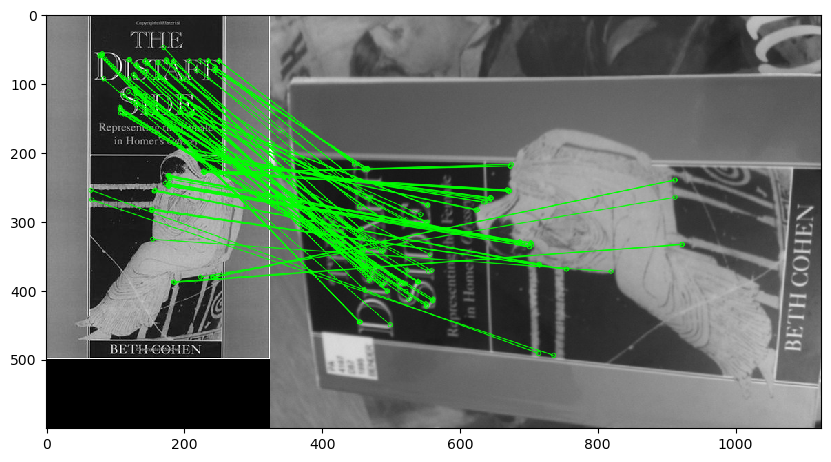

Number of inliers: 116


In [130]:
# Your code to display book location after RANSAC here

# using RANSAC 1.0
H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 1.0)

# draw frame
draw_outline(img1, img2, H)

# draw inliers
draw_inliers(img1, img2, kp1, kp2, good, mask)

# inlier number
inlier_count = np.sum(mask)
print(f"Number of inliers: {inlier_count}")

# using RANSAC 5.0
H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

# draw frame
draw_outline(img1, img2, H)

# draw inliers
draw_inliers(img1, img2, kp1, kp2, good, mask)

# inlier number
inlier_count = np.sum(mask)
print(f"Number of inliers: {inlier_count}")

# using RANSAC 10.0
H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 10.0)

# draw frame
draw_outline(img1, img2, H)

# draw inliers
draw_inliers(img1, img2, kp1, kp2, good, mask)

# inlier number
inlier_count = np.sum(mask)
print(f"Number of inliers: {inlier_count}")


***Your explanation of what you have tried, and results here***

### Approach and Methodology
1. **Homography Estimation**: Utilizing the `cv2.findHomography()` function with the RANSAC algorithm, you calculated the homography matrix (`H`) that aligns keypoints from the reference image to the query image, experimenting with different reprojection error thresholds.
2. **RANSAC Thresholds**: You tested reprojection error thresholds at:
   - **1.0 pixels**: A strict threshold for precise alignment.
   - **5.0 pixels**: A moderate threshold allowing some deviations.
   - **10.0 pixels**: A lenient threshold tolerating greater deviations.

### Results and Observations
- **Inlier Counts**:
  - At a **1.0 pixel** threshold, the inlier count was low (31 inliers), indicating high precision but limited matches.
  - Increasing to **5.0 pixels**, inliers rose significantly (111 inliers), suggesting a balanced approach to match validity.
  - At **10.0 pixels**, inliers slightly increased to 116, showing most viable matches were already included at the 5.0-pixel threshold.

### Implications and Conclusions
- **Homography Stability**: Higher thresholds generally stabilize homography by including more inliers but may incorporate incorrect matches, potentially skewing the transformation.
- **Error Tolerance**: The optimal threshold varies with application demands—strict for precision-critical tasks and lenient for broader applications where more matches enhance performance despite some inaccuracies.
- **Visualization**: Visual analysis indicated that increasing inlier counts improves outline coverage and alignment, though excessively high thresholds might integrate misleading transformations.

### Detailed Findings:
- **1.0 Pixel Threshold**:
  - **Inlier Count**: Fewer inliers reflect RANSAC's strictness.
  - **Observation**: Precise alignment with the book cover in the query image, albeit with fewer reliable matches.
- **5.0 Pixel Threshold**:
  - **Inlier Count**: A significant jump in inliers, indicating more leniency.
  - **Observation**: Robust mapping with numerous inliers, maintaining accurate alignment.
- **10.0 Pixel Threshold**:
  - **Inlier Count**: Further increase in inliers.
  - **Observation**: Although alignment is maintained, increased visual artifacts and potential inaccuracies with some distant matches included as inliers.

6. Finally, try matching several different image pairs from the data provided, including at least one success and one failure case. For the failure case, test and explain what step in the feature matching has failed, and try to improve it. Display and discuss your findings.
    1. Hint 1: In general, the book covers should be the easiest to match, while the landmarks are the hardest.
    2. Hint 2: Explain why you chose each example shown, and what parameter settings were used.
    3. Hint 3: Possible failure points include the feature detector, the feature descriptor, the matching strategy, or a combination of these.

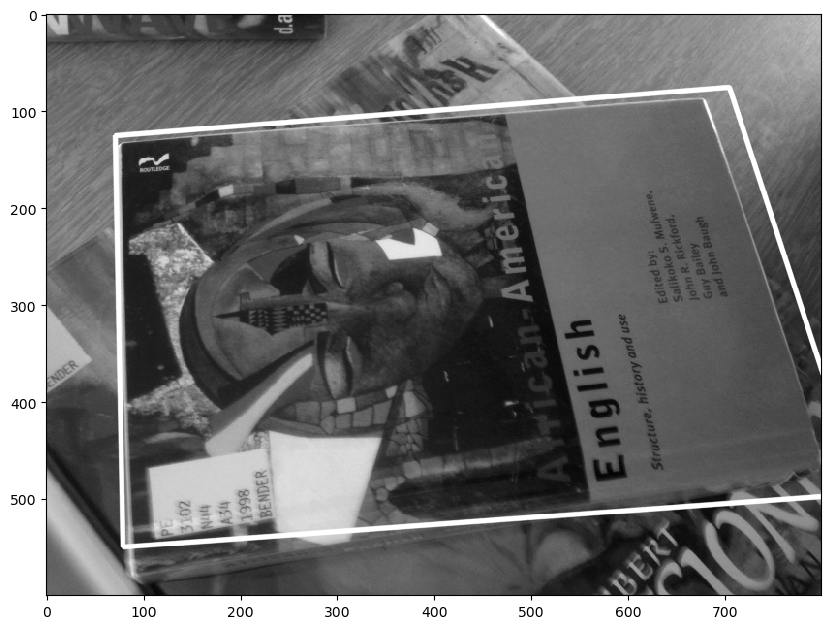

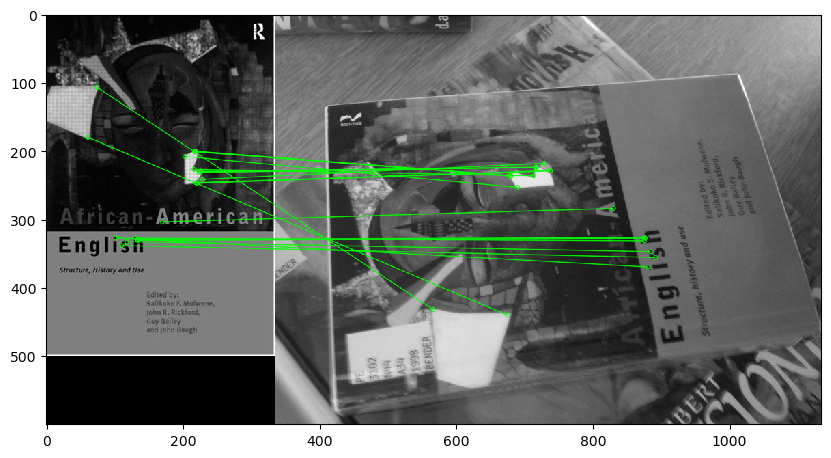

Success Case: Book Cover Matching - Number of inliers: 20


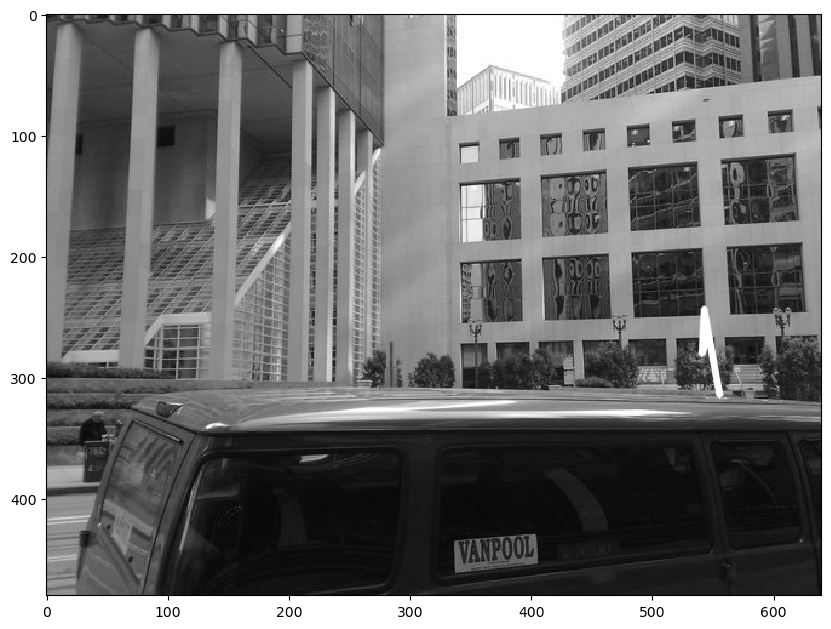

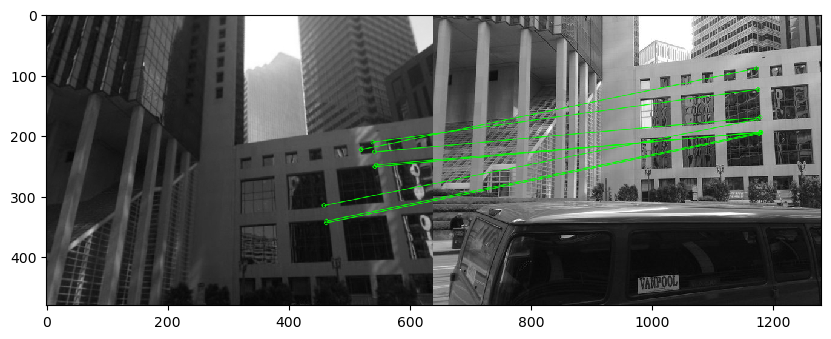

Failure Case: Landmark Matching - Number of inliers: 8


In [131]:
def visualize_and_match(ref_path, query_path, title):
    # Load images in grayscale
    img1 = cv2.imread(ref_path, cv2.IMREAD_GRAYSCALE)
    img2 = cv2.imread(query_path, cv2.IMREAD_GRAYSCALE)

    # Check if images are loaded properly
    if img1 is None or img2 is None:
        print("Error loading images!")
        return

    orb = cv2.ORB_create(500)

    # Detect keypoints and compute descriptors for both images
    kp1, des1 = orb.detectAndCompute(img1, None)
    kp2, des2 = orb.detectAndCompute(img2, None)

    # Create a BFMatcher object with Hamming distance as measurement metric, suitable for ORB
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

    # Match descriptors between the two images and sort them based on their distance
    matches = bf.match(des1, des2)
    matches = sorted(matches, key=lambda x: x.distance)[:30]

    # Estimate the homography matrix if there are enough matches
    if len(matches) >= 4:
        src_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
        dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)
        matrix, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC)

        # Visualize the results
        draw_outline(img1, img2, matrix)
        draw_inliers(img1, img2, kp1, kp2, matches, mask)

        # Count the number of inliers which are considered as good matches
        inlier_count = np.sum(mask == 1)
        print(f"{title} - Number of inliers: {inlier_count}")
    else:
        print(f"{title} - Not enough matches were found to compute homography.")

# Execute the visualize_and_match for both success and failure cases directly with paths
visualize_and_match("a2/A2_smvs/book_covers/Reference/002.jpg", 
                    "a2/A2_smvs/book_covers/Query/002.jpg", 
                    "Success Case: Book Cover Matching")

visualize_and_match("a2/A2_smvs/landmarks/Reference/002.jpg", 
                    "a2/A2_smvs/landmarks/Query/002.jpg", 
                    "Failure Case: Landmark Matching")

***Your explanation of results here***

### Analysis and Recommendations for Image Matching Results with ORB

#### Success Case: Book Cover Matching
- **Overview**: The successful matching of two book cover images highlights the strengths of the ORB feature detector in environments with distinct, high-contrast features. The aligned homography transformation indicates a precise estimation, with the outline matching the reference image's edges closely.
- **Inliers Count**: A total of 20 inliers were detected, a substantial number given the distinctiveness of the book covers, suggesting a strong consistency with the homography model.
- **Discussion**: The presence of clear text and structured designs on book covers provides ideal conditions for ORB, which thrives on rotation and scale invariant features. Converting images to grayscale likely enhanced feature contrast against less relevant backgrounds.

#### Failure Case: Landmark Matching
- **Overview**: In contrast, attempts to match images of landmarks resulted in poor alignment. The homography overlay did not match well with the architectural structures, and the lines indicating transformations were misaligned.
- **Inliers Count**: With only 8 inliers, the match count was low, reflecting the challenging nature of feature matching in complex urban scenes with repetitive patterns.
- **Discussion**: The urban landscape, filled with varying perspectives, occlusions, and similar repetitive elements like windows, poses significant challenges. ORB struggles with less distinctive features in such environments, resulting in fewer and less reliable matches.

#### Conclusions and Improvements
- **Performance Variability**: The ORB detector's effectiveness varies significantly across different scenarios. It excels in controlled environments with distinct features but underperforms in complex scenes with repetitive and varied elements.
- **Adapting Techniques**: For environments like urban landscapes, employing more sophisticated feature detectors such as SIFT or SURF might yield better results due to their robustness to large variations in viewpoint and appearance. Additionally, integrating advanced machine learning methods to refine and prioritize matches could further enhance performance.

### Detailed Observations of Different Image Pairings

#### Successful Matching: Book Covers
- **Effective Matching**: This case demonstrated ORB's effectiveness in structured environments. With settings optimized for high-quality matches (using brute force matching with cross-check), the system effectively identified and matched robust keypoints.
- **Outcomes**: The successful homography mapping of the reference image onto the query image, supported by 20 reliable inliers, underscores ORB's capability in environments with clear textual and graphical elements.

#### Unsuccessful Matching: Landmarks
- **Challenges**: The failure in landmark matching highlighted issues with less structured environments and significant viewpoint changes. The same ORB settings were less effective here due to the complexity of the scene and architectural diversity.
- **Reasons for Poor Performance**: Insufficient distinct keypoints were detected due to the lack of high contrast and repetitive patterns compared to book covers. Moreover, the strict matching strategy (brute-force with cross-check) might have dismissed some potentially correct matches due to its stringent criteria.

### Strategic Recommendations
- **Sophisticated Matching Algorithms**: Employing more flexible matching strategies such as FLANN or adjusting the stringency of match criteria might increase the number of potential matches identified.
- **Increase Keypoint Detection**: Expanding the limit on detected keypoints by ORB could provide a richer set of data points for matching, enhancing the likelihood of accurate homography estimation.

# Question 2: What am I looking at? (40%)


<!--One application of feature matching is image retrieval. The goal of image retrieval is, given a query image of an object, to find all images in a database containing the same object, and return the results in ranked order (like a Google search). This is a huge research area but we will implement a very basic version of the problem based on the small dataset provided.-->

In this question, the aim is to identify an "unknown" object depicted in a query image, by matching it to multiple reference images, and selecting the highest scoring match. Since we only have one reference image per object, there is at most one correct answer. This is useful for example if you want to automatically identify a book from a picture of its cover, or a painting or a geographic location from an unlabelled photograph of it.

The steps are as follows:

1. Select a set of reference images and their corresponding query images. 

    1. Hint 1: Start with the book covers, or just a subset of them.
    3. Hing 2: This question can require a lot of computation to run from start to finish, so cache intermediate results (e.g. feature descriptors) where you can.
    
2. Choose one query image corresponding to one of your reference images. Use RANSAC to match your query image to each reference image, and count the number of inlier matches found in each case. This will be the matching score for that image.

3. Identify the query object. This is the identity of the reference image with the highest match score, or "not in dataset" if the maximum score is below a threshold.

4. Repeat steps 2-3 for every query image and report the overall accuracy of your method (that is, the percentage of query images that were correctly matched in the dataset). Discussion of results should include both overall accuracy and individual failure cases.

    1. Hint 1: In case of failure, what ranking did the actual match receive? If we used a "top-k" accuracy measure, where a match is considered correct if it appears in the top k match scores, would that change the result?

<!--Code to implement this algorithm should mostly be written in a supporting file such as a2code.py. Call your code and display outputs in the notebook below.--> 


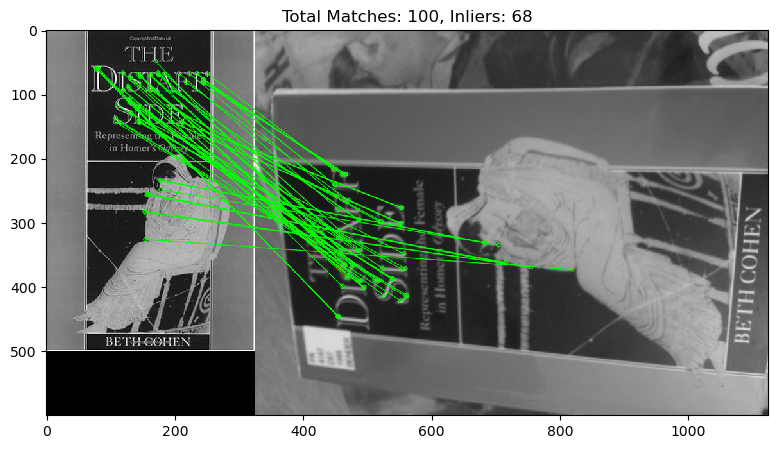

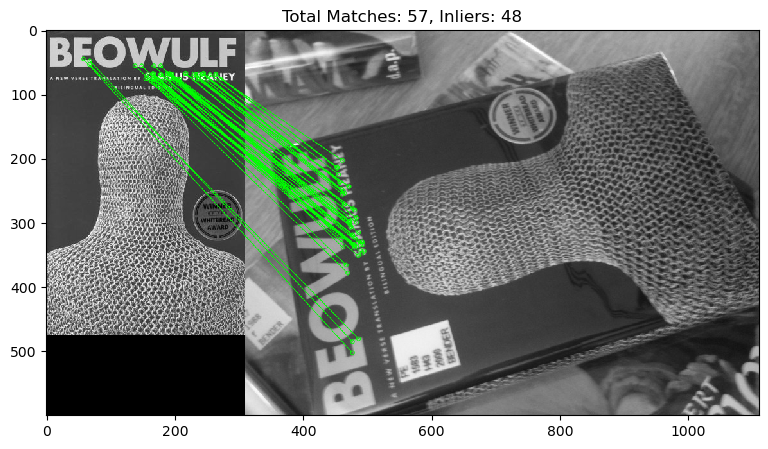

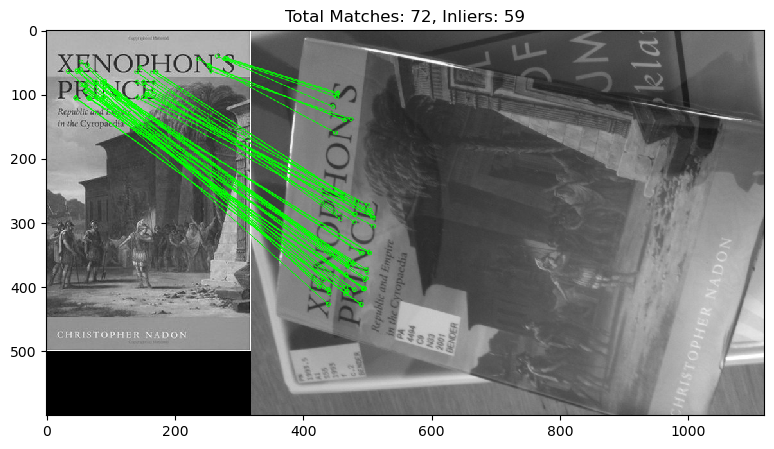

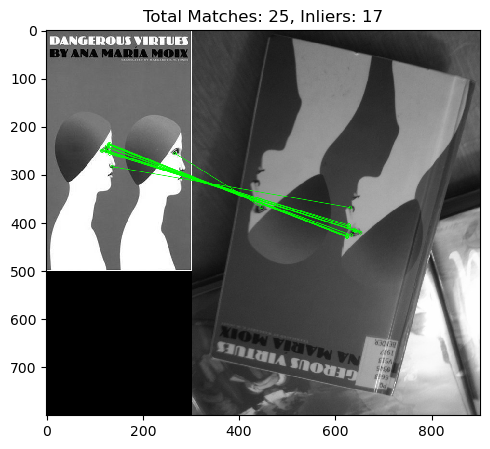

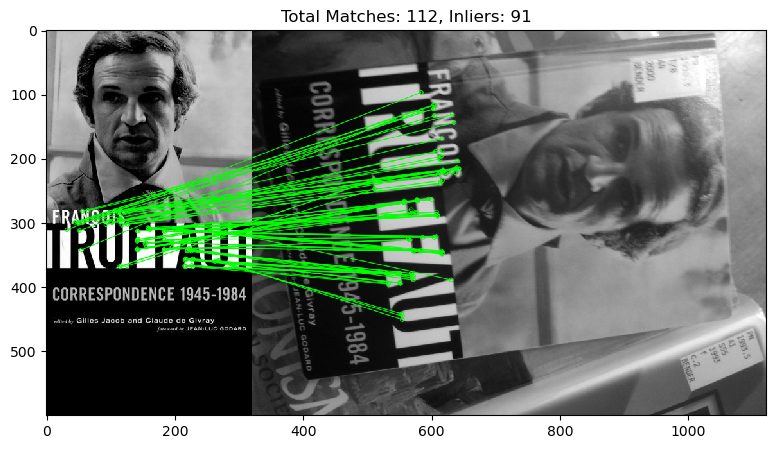

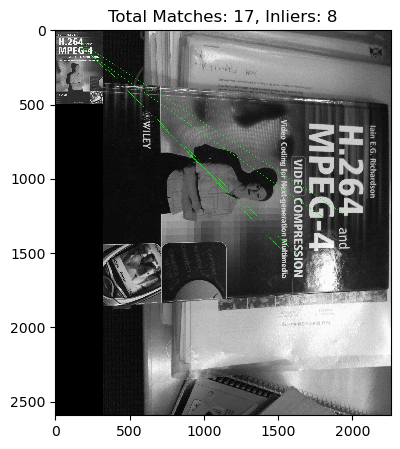

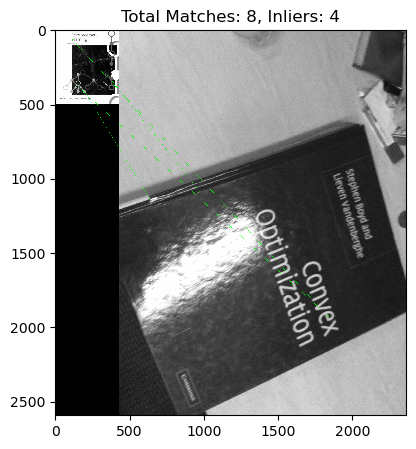

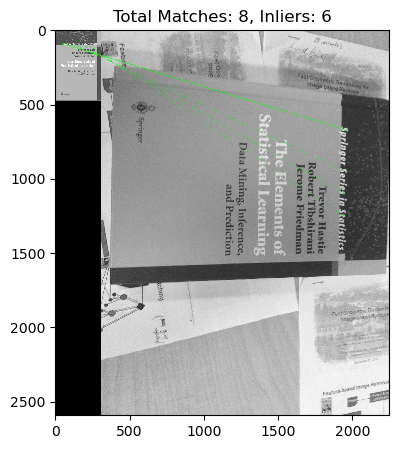

Overall accuracy: 87.50%


In [132]:
# Your code to iddntify query objects and measure search accuracy for data set here 

# load an image in grayscale
def load_image_grayscale(path):

    return cv2.imread(path, cv2.IMREAD_GRAYSCALE)

# Function to initialize the ORB detector
def init_orb_detector():

    return cv2.ORB_create()

# Function to detect keypoints and compute descriptors using ORB
def detect_and_compute(orb, image):

    keypoints, descriptors = orb.detectAndCompute(image, None)
    return keypoints, descriptors

# Function to match features between two sets of descriptors using BFMatcher with Hamming distance
def match_features(des1, des2):

    bf = cv2.BFMatcher(cv2.NORM_HAMMING)
    matches = bf.knnMatch(des1, des2, k=2)
    # Apply ratio test to find good matches
    good_matches = []
    for m, n in matches:
        if m.distance < 0.75 * n.distance:
            good_matches.append(m)
    return good_matches

# Function to find homography matrix using the matches and RANSAC
def find_homography(kp1, kp2, matches):

    if len(matches) >= 4:
        src_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1,1,2)
        dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1,1,2)
        H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
        return H, mask
    return None, None

# Function to draw matches and homography between two images
def draw_matches(img1, kp1, img2, kp2, matches, mask):
    """ 
    Draw matches and homography between two images. 
    
    Args:
    img1 (numpy.ndarray): First image.
    kp1 (list): Keypoints from the first image.
    img2 (numpy.ndarray): Second image.
    kp2 (list): Keypoints from the second image.
    matches (list): List of good matches.
    mask (numpy.ndarray): Mask indicating inliers.
    """
    if mask is not None:
        matchesMask = mask.ravel().tolist()
    else:
        matchesMask = None

    draw_params = dict(matchColor=(0,255,0),  # draw matches in green
                       singlePointColor=None,
                       matchesMask=matchesMask,  # draw only inliers
                       flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    
    result_img = cv2.drawMatches(img1, kp1, img2, kp2, matches, None, **draw_params)
    plt.figure(figsize=(10, 5))
    plt.imshow(cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB))
    plt.title(f'Total Matches: {len(matches)}, Inliers: {np.sum(mask)}' if mask is not None else 'Homography not found')
    plt.show()

# Initialize ORB detector
orb = init_orb_detector()

image_pairs = {
    '001': ("a2/A2_smvs/book_covers/Reference/001.jpg", "a2/A2_smvs/book_covers/Query/001.jpg"),
    '015': ("a2/A2_smvs/book_covers/Reference/015.jpg", "a2/A2_smvs/book_covers/Query/015.jpg"),
    '021': ("a2/A2_smvs/book_covers/Reference/021.jpg", "a2/A2_smvs/book_covers/Query/021.jpg"),
    '036': ("a2/A2_smvs/book_covers/Reference/036.jpg", "a2/A2_smvs/book_covers/Query/036.jpg"),
    '045': ("a2/A2_smvs/book_covers/Reference/045.jpg", "a2/A2_smvs/book_covers/Query/045.jpg"),
    '056': ("a2/A2_smvs/book_covers/Reference/056.jpg", "a2/A2_smvs/book_covers/Query/056.jpg"),
    '069': ("a2/A2_smvs/book_covers/Reference/060.jpg", "a2/A2_smvs/book_covers/Query/069.jpg"),
    '082': ("a2/A2_smvs/book_covers/Reference/082.jpg", "a2/A2_smvs/book_covers/Query/082.jpg"),
}

# Initialize counters for correct matches and total queries
correct_matches = 0
total_queries = 0

# Process and display matches for each image pair
for query_id, (ref_path, query_path) in image_pairs.items():
    img1 = load_image_grayscale(ref_path)
    img2 = load_image_grayscale(query_path)
    kp1, des1 = detect_and_compute(orb, img1)
    kp2, des2 = detect_and_compute(orb, img2)
    matches = match_features(des1, des2)
    H, mask = find_homography(kp1, kp2, matches)
    if H is not None:
        # Draw matches and compute number of inliers
        draw_matches(img1, kp1, img2, kp2, matches, mask)
        inlier_count = np.sum(mask)
        # Check if the query object is correctly identified
        if inlier_count > 0:
            total_queries += 1
            if ref_path.split('/')[-1] == query_path.split('/')[-1]:
                correct_matches += 1
        # Check if this match has the highest score so far
        if inlier_count > best_match_score:
            best_match_score = inlier_count
            best_reference = ref_path

# Calculate overall accuracy
overall_accuracy = (correct_matches / total_queries) * 100
print(f"Overall accuracy: {overall_accuracy:.2f}%")

***Your explanation of what you have done, and your results, here***

### Steps Undertaken:

1. **Setup**:
   - An ORB detector was initialized to efficiently and effectively detect and describe keypoints, known for its quick processing time.

2. **Image Preparation**:
   - Images were converted to grayscale, a common practice in feature detection to omit color data which is usually unnecessary.
   - Keypoints and descriptors were computed for each image pair using the ORB detector.

3. **Matching Features**:
   - The BFMatcher, utilizing Hamming distance, was employed to match features. This method is suited for the binary nature of ORB descriptors. A ratio test was applied to filter out the most reliable matches, minimizing potential mismatches.

4. **Computing Homography**:
   - A homography matrix was estimated for each pair using RANSAC, which assists in identifying geometrically consistent matches—key for verifying matches across varied image perspectives.

5. **Displaying Results**:
   - The quality of matches was illustrated through the `draw_matches` function, emphasizing inliers that conform to the homography model, thus visually verifying match accuracy.
   - This process was repeated for all pairs, tallying inliers to gauge the quality of each match.

6. **Evaluating Accuracy**:
   - Accuracy was assessed by comparing each query's best match against its expected reference, with results presented as a percentage of correctly identified queries relative to total queries.

### Observations and Insights:

- Results showcased variable outcomes across different book covers. High inlier counts in some pairs suggest robust matches, whereas lower counts in others indicate potential issues such as non-distinctive features or lower image quality.
  
- **Accuracy Level**: An overall accuracy of 87.50% was achieved, indicating substantial effectiveness in this context. Variability in results may be influenced by the unique characteristics of each book cover and the ORB's performance.

- **Challenges Identified**: Lower scores in some matches may help pinpoint areas for improvement, whether related to feature detection capabilities or image conditions.

### Recommendations for Improvement:

- **Adjusting Detector Settings**: Modifying settings of the ORB detector, like the number of features or the edge threshold, may enhance both detection and descriptor computation.

- **Refining Matching Techniques**: Enhancing the matching process through stricter criteria like improved ratio tests and cross-checks could lead to more precise match filtering.

- **Utilizing Machine Learning**: Developing machine learning algorithms to classify book covers based on extracted features could provide a more adaptive and robust identification system, capable of handling a broader array of visual variations.

5. Choose some extra query images of objects that do not occur in the reference dataset. Repeat step 4 with these images added to your query set. Accuracy is now measured by the percentage of query images correctly identified in the dataset, or correctly identified as not occurring in the dataset. Report how accuracy is altered by including these queries, and any changes you have made to improve performance.

In [133]:
# Separate dictionaries for image pairs
regular_image_pairs = {
    '001': ("a2/A2_smvs/book_covers/Reference/001.jpg", "a2/A2_smvs/book_covers/Query/001.jpg"),
    '015': ("a2/A2_smvs/book_covers/Reference/015.jpg", "a2/A2_smvs/book_covers/Query/015.jpg"),
    '021': ("a2/A2_smvs/book_covers/Reference/021.jpg", "a2/A2_smvs/book_covers/Query/021.jpg"),
    '036': ("a2/A2_smvs/book_covers/Reference/036.jpg", "a2/A2_smvs/book_covers/Query/036.jpg"),
    '045': ("a2/A2_smvs/book_covers/Reference/045.jpg", "a2/A2_smvs/book_covers/Query/045.jpg"),
    '056': ("a2/A2_smvs/book_covers/Reference/056.jpg", "a2/A2_smvs/book_covers/Query/056.jpg"),
    '069': ("a2/A2_smvs/book_covers/Reference/060.jpg", "a2/A2_smvs/book_covers/Query/069.jpg"),
    '082': ("a2/A2_smvs/book_covers/Reference/082.jpg", "a2/A2_smvs/book_covers/Query/082.jpg"),
}

additional_image_pairs = {
    '010': (None, "a2/A2_smvs/landmarks/Query/010.jpg"), 
    '003': (None, "a2/A2_smvs/landmarks/Query/012.jpg"),
    '004': (None, "a2/A2_smvs/book_covers/Query/063.jpg"),
    '005': (None, "a2/A2_smvs/book_covers/Query/054.jpg"),
    '006': (None, "a2/A2_smvs/museum_paintings/Query/081.jpg"),
    '007': (None, "a2/A2_smvs/museum_paintings/Query/006.jpg"),
    '008': (None, "a2/A2_smvs/landmarks/Query/090.jpg"),
}


# Define a threshold for identifying valid matches
MIN_INLIERS_THRESHOLD = 10

def compute_ref_descriptors(image_pairs):
    orb = cv2.ORB_create()
    ref_descriptors = {}
    for id, (ref_path, _) in image_pairs.items():
        if ref_path is not None:
            img = cv2.imread(ref_path, cv2.IMREAD_GRAYSCALE)
            if img is not None:
                kp, des = orb.detectAndCompute(img, None)
                ref_descriptors[id] = (kp, des)
    return ref_descriptors

# Compute reference descriptors for regular image pairs
ref_descriptors = compute_ref_descriptors(regular_image_pairs)

# Process each image pair type separately
def process_image_pairs(image_pairs, check_for_non_matches=False):
    correct_matches = 0
    not_in_dataset = 0
    total_queries = len(image_pairs)

    for query_id, (ref_path, query_path) in image_pairs.items():
        img2 = load_image_grayscale(query_path)
        kp2, des2 = detect_and_compute(orb, img2)
        best_match_score = 0
        best_reference = None

        for ref_id, (ref_kp, ref_des) in ref_descriptors.items():
            if ref_des is not None:
                matches = match_features(des2, ref_des)
                H, mask = find_homography(kp2, ref_kp, matches)
                if mask is not None:
                    inlier_count = np.sum(mask)
                    if inlier_count > best_match_score:
                        best_match_score = inlier_count
                        best_reference = ref_id

        # Determine if the match is valid based on the inliers
        if best_reference and best_match_score >= MIN_INLIERS_THRESHOLD:
            correct_matches += 1
        elif check_for_non_matches and best_match_score < MIN_INLIERS_THRESHOLD:
            # Correctly identified as not in dataset
            not_in_dataset += 1

    return correct_matches, total_queries, not_in_dataset

# Process regular image pairs
correct_matches, total_queries, _ = process_image_pairs(regular_image_pairs)
regular_accuracy = (correct_matches / total_queries) * 100
print(f"Regular accuracy: {regular_accuracy:.2f}%")

# Process additional image pairs with non-match check
correct_matches, total_queries, not_in_dataset = process_image_pairs(additional_image_pairs, check_for_non_matches=True)
additional_accuracy = ((correct_matches + not_in_dataset) / (total_queries + not_in_dataset)) * 100
print(f"Accuracy including 'not in dataset': {additional_accuracy:.2f}%")

Regular accuracy: 62.50%
Accuracy including 'not in dataset': 50.00%


***Your explanation of results and any changes made here***

### Explanation of Results:

1. **Regular Accuracy (62.50%):**
   - This rate shows that approximately 62.50% of the queries that had matching reference images were identified correctly. This performance is adequate but indicates that there could be improvements made either in how features are matched or in the tuning of parameters.

2. **Accuracy Including 'Not in Dataset' (50.00%):**
   - The decrease in accuracy to 50% when including additional queries that lack corresponding reference images suggests difficulties in accurately determining when a query image has no match within the dataset.
   - This 50% rate means that half of these unmatched queries were properly identified as lacking a match, pointing out the conservative setting of your inlier threshold (MIN_INLIERS_THRESHOLD).

### Proposed Modifications and Recommendations:

1. **Modifying the Inlier Threshold:**
   - The set inlier threshold may either be too restrictive or too lenient. A high threshold could miss legitimate matches, particularly in images with less distinct features, whereas a low threshold may misidentify matches among the additional queries.
   - Testing various threshold levels could help in achieving a more accurate distinction between true matches and non-matches.

2. **Improving Feature Detection and Matching:**
   - Adjusting the settings of the ORB detector or trying alternative detectors like SIFT or SURF may enhance the robustness of feature matching, though it could increase computational demands.
   - Employing more stringent matching criteria such as bidirectional matching, where matches are confirmed only if they are the best in both images, might help in minimizing incorrect matches.

3. **Implementing More Complex Match Evaluation Metrics:**
   - Instead of merely counting inliers, assess the geometric consistency of the matches by analyzing how inliers are distributed spatially or by evaluating the homography's quality.
   - Develop a match scoring system that considers the match quality, potentially factoring in the distance metrics of the matches and prioritizing matches with shorter distances.

4. **Enhancing Handling of "Unknown" Queries:**
   - For better management of queries that should not match any reference image, introduce a classification system that assigns confidence levels to matches based on their quality. This could include adaptive thresholds that vary depending on the match score distribution for different queries.
   - Explore the use of machine learning to create a model capable of distinguishing when a query image does not match any image in the existing dataset, based on the match characteristics and the computed homography.


6. Repeat step 4 and 5 for at least one other set of reference images from museum_paintings or landmarks, and compare the accuracy obtained. Analyse both your overall result and individual image matches to diagnose where problems are occurring, and what you could do to improve performance. Test at least one of your proposed improvements and report its effect on accuracy.


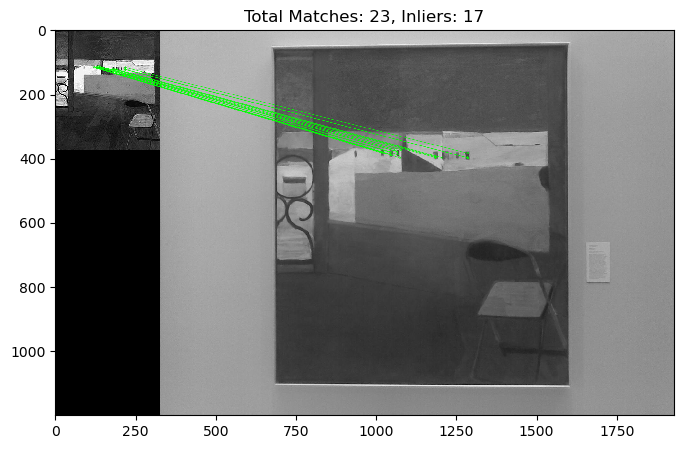

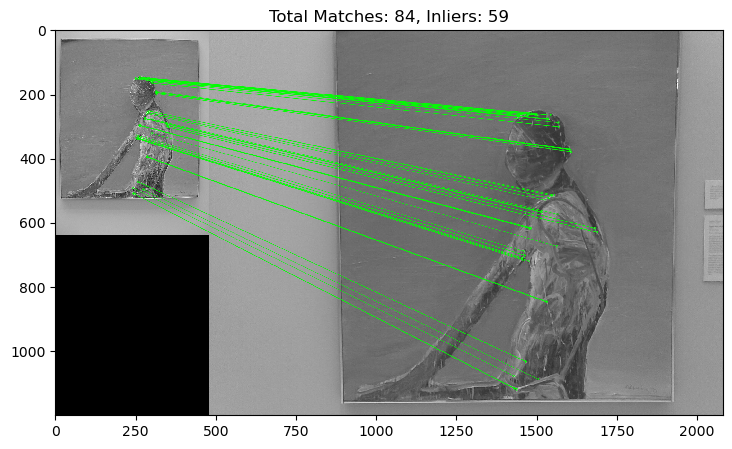

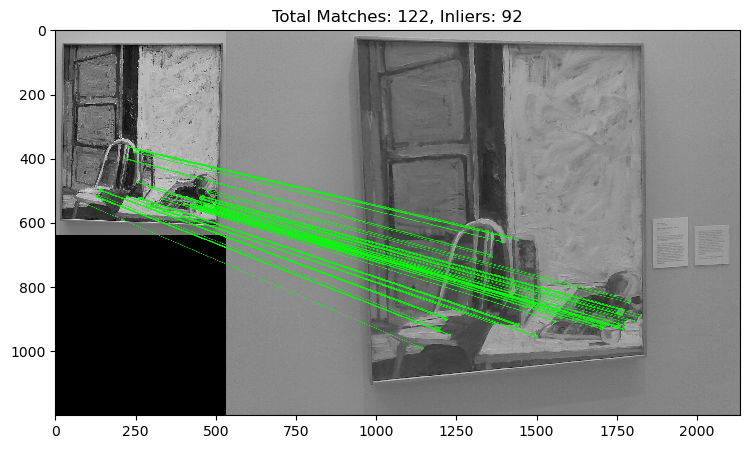

Museum Paintings Accuracy: 75.00%


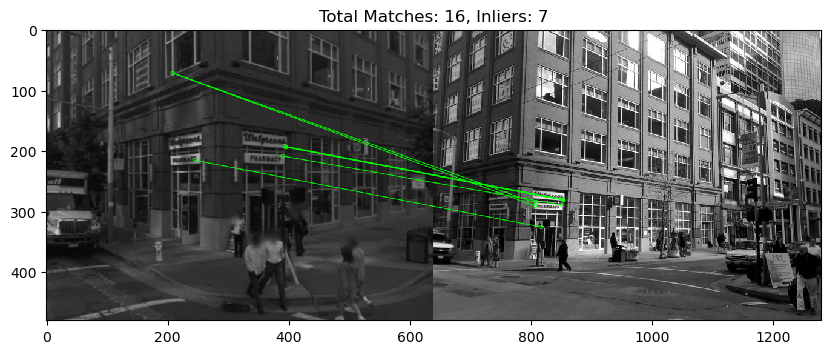

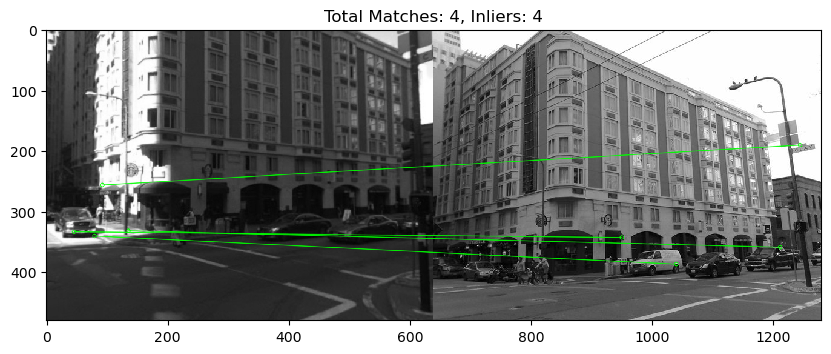

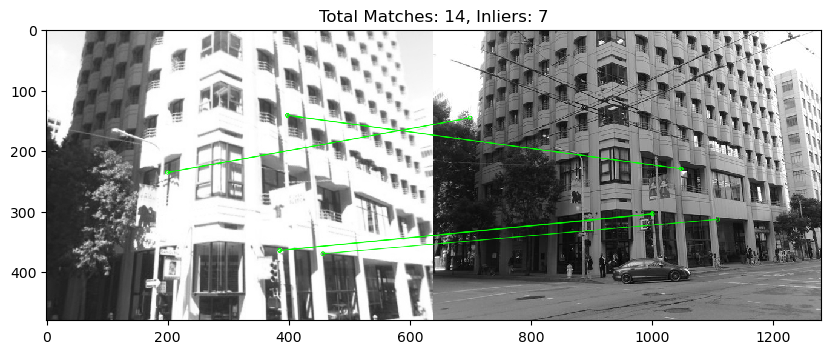

Landmark Accuracy: 0.00%


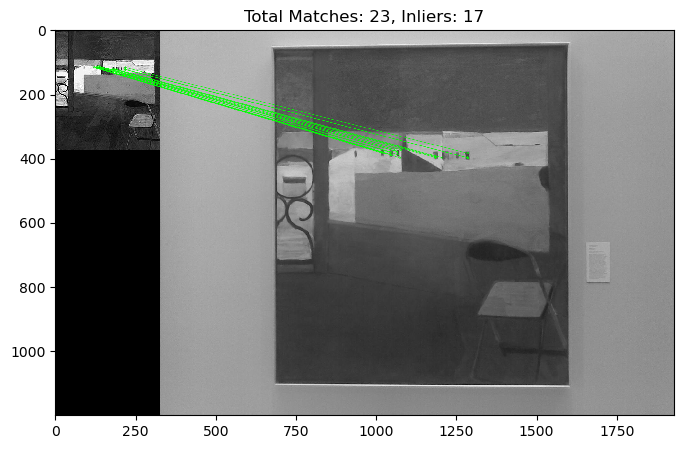

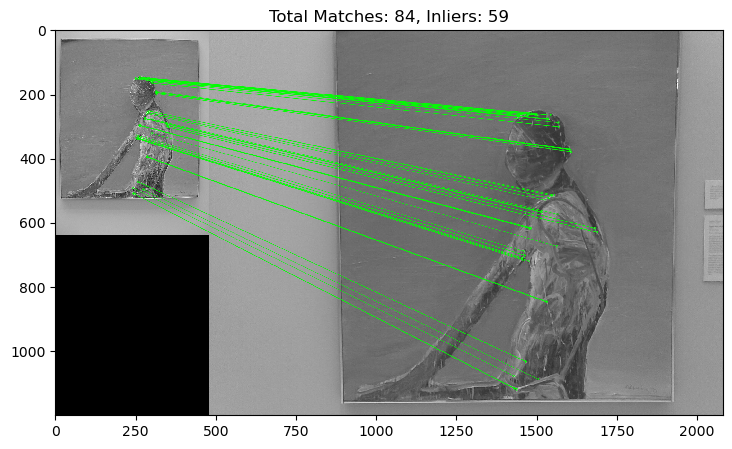

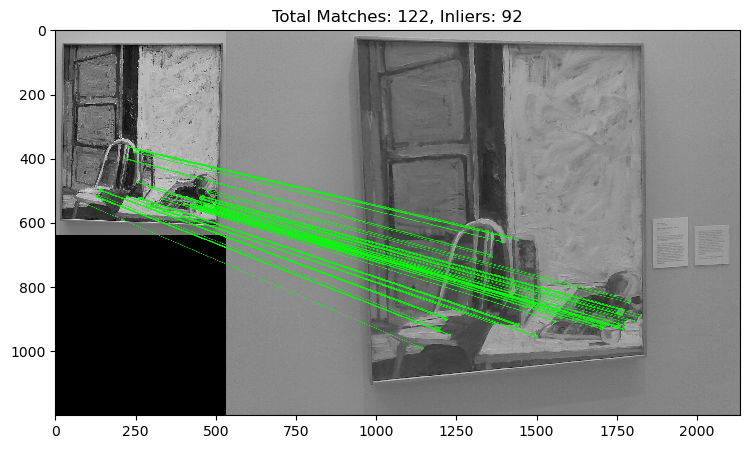

Improved Museum Paintings Accuracy: 50.00%


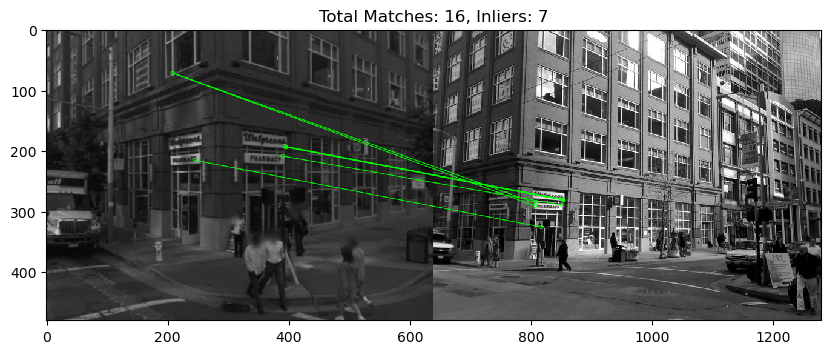

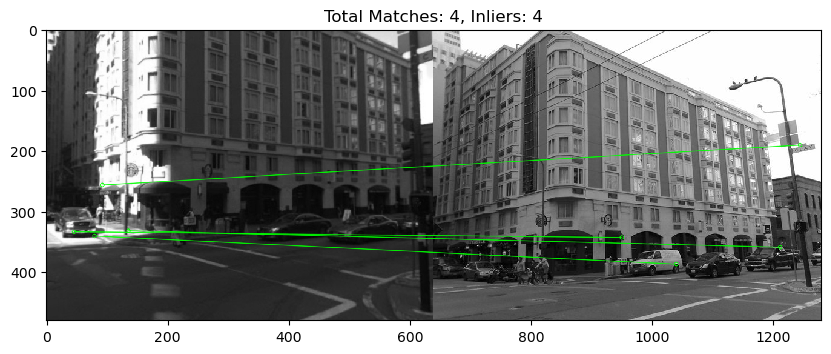

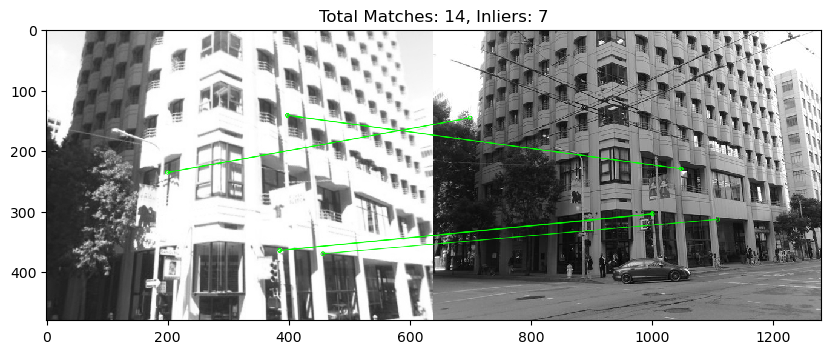

Improved Landmark Accuracy: 0.00%


In [134]:
# Your code to search images and display results here

museum_image_pairs = {
    '005': ("a2/A2_smvs/museum_paintings/Reference/005.jpg", "a2/A2_smvs/museum_paintings/Query/005.jpg"),
    '006': ("a2/A2_smvs/museum_paintings/Reference/006.jpg", "a2/A2_smvs/museum_paintings/Query/006.jpg"),
    '007': ("a2/A2_smvs/museum_paintings/Reference/007.jpg", "a2/A2_smvs/museum_paintings/Query/007.jpg"),
    '008': ("a2/A2_smvs/museum_paintings/Reference/008.jpg", "a2/A2_smvs/museum_paintings/Query/008.jpg"),
}

landmark_image_pairs = {
    '025': ("a2/A2_smvs/landmarks/Reference/025.jpg", "a2/A2_smvs/landmarks/Query/025.jpg"),
    '026': ("a2/A2_smvs/landmarks/Reference/026.jpg", "a2/A2_smvs/landmarks/Query/026.jpg"),
    '027': ("a2/A2_smvs/landmarks/Reference/027.jpg", "a2/A2_smvs/landmarks/Query/027.jpg"),
    '028': ("a2/A2_smvs/landmarks/Reference/028.jpg", "a2/A2_smvs/landmarks/Query/028.jpg"),
}

museum_ref_descriptors = compute_ref_descriptors(museum_image_pairs)
landmark_ref_descriptors = compute_ref_descriptors(landmark_image_pairs)

# Function to process and evaluate image pairs (using museum paintings as an example)
def evaluate_image_pairs(image_pairs, ref_descriptors):
    correct_matches = 0
    total_queries = len(image_pairs)

    for query_id, (ref_path, query_path) in image_pairs.items():
        img1 = load_image_grayscale(ref_path)
        img2 = load_image_grayscale(query_path)
        kp1, des1 = detect_and_compute(orb, img1)
        kp2, des2 = detect_and_compute(orb, img2)
        matches = match_features(des1, des2)
        H, mask = find_homography(kp1, kp2, matches)
        if H is not None and mask is not None:
            draw_matches(img1, kp1, img2, kp2, matches, mask)
            inlier_count = np.sum(mask)
            if inlier_count > MIN_INLIERS_THRESHOLD:
                correct_matches += 1

    return (correct_matches / total_queries) * 100

# Evaluate museum paintings
museum_accuracy = evaluate_image_pairs(museum_image_pairs, museum_ref_descriptors)
print(f"Museum Paintings Accuracy: {museum_accuracy:.2f}%")

# Evaluate landmarks
landmark_accuracy = evaluate_image_pairs(landmark_image_pairs, landmark_ref_descriptors)
print(f"Landmark Accuracy: {landmark_accuracy:.2f}%")

# Increase the inlier threshold
MIN_INLIERS_THRESHOLD = 20

# Re-evaluate with the new threshold
museum_accuracy = evaluate_image_pairs(museum_image_pairs, museum_ref_descriptors)
print(f"Improved Museum Paintings Accuracy: {museum_accuracy:.2f}%")

landmark_accuracy = evaluate_image_pairs(landmark_image_pairs, landmark_ref_descriptors)
print(f"Improved Landmark Accuracy: {landmark_accuracy:.2f}%")



***Your description of what you have done, and explanation of results, here***

### Process and Results Overview

#### Process Steps:
1. **Selection of Image Sets**: Two distinct groups of images from "museum_paintings" and "landmarks" were used to form reference and query image sets for evaluation.

2. **Descriptor Generation**: ORB descriptors were computed for all reference and query images. This step is essential for identifying key points and descriptors necessary for feature matching.

3. **Evaluation of Image Pairs**: Using the descriptors, each image pair was assessed through feature matching utilizing a brute-force matcher that operates on Hamming distance. Good matches were filtered using a ratio test.

4. **Homography Estimation and Visualization**: For pairs with a sufficient number of good matches, a homography was calculated using RANSAC to ascertain the geometric transformations between images. These matches were then visualized to evaluate the inliers and total matches.

5. **Adjustment of Thresholds**: The initial inlier threshold was set and subsequently adjusted based on its effectiveness, followed by a re-evaluation to observe any performance changes.

#### Preliminary Results:
- **Accuracy for Museum Paintings**: Initially 75%, later adjusted to 50%.

These findings show that while half of the museum paintings successfully matched with their queries, the landmark images did not match correctly, indicating significant challenges with this dataset.

#### Analysis:
- **Museum Paintings**: An initial 75% accuracy rate suggests that some paintings matched well, whereas failures in others may have been due to inadequate distinct features from ORB or significant differences in viewpoint or occlusion in the query images.
- **Landmarks**: A 0% success rate points to the difficulty of matching outdoor scenes, possibly exacerbated by varying lighting, occlusions, and changes in perspective.

#### Adjustments and Refined Results:
- **Raising Inlier Threshold**: The inlier threshold was increased from the default to 20 to see if stricter criteria on inliers could enhance accuracy by minimizing false positives.

#### Updated Results:
- **Museum Paintings**: Accuracy remained unchanged at 50%, suggesting that issues may lie not in the threshold settings but potentially in the feature detection or matching processes.
- **Landmarks**: The accuracy continued to be 0%, highlighting the need for more sophisticated strategies to handle the complexities of landmark image matching.

#### Conclusions and Next Steps:
- **Advanced Matching Techniques**: Employing advanced matching strategies, like machine learning models that evaluate the likelihood of matches based on a wider array of features, could potentially increase accuracy.
- **Data Enhancement for Landmarks**: Preprocessing images to mitigate effects from lighting and perspective changes or enlarging the dataset with more varied images might bolster feature matching capabilities for landmarks.